# Audio source separation

Requires `scipy==1.10.1` and `mdct==0.4`. 

Execute the next cell to install these libraries then restart the kernel.

In [1]:
!pip install scipy==1.10.1 mdct==0.4


[notice] A new release of pip is available: 24.0 -> 24.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal import hamming
from scipy.spatial.distance import cdist

import IPython.display as ipd
from mdct.fast import mdct, imdct
from scipy.io.wavfile import write

plt.rcParams['figure.figsize'] = (12,8)

In [3]:
# useful functions

def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:,np.newaxis]
    times = np.arange(data.shape[0])/rate
    plt.figure(figsize=(30,6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()
    
def play_sound(data, rate):
    return ipd.display(ipd.Audio(data.T, rate=rate))

T = 220501, M = 2


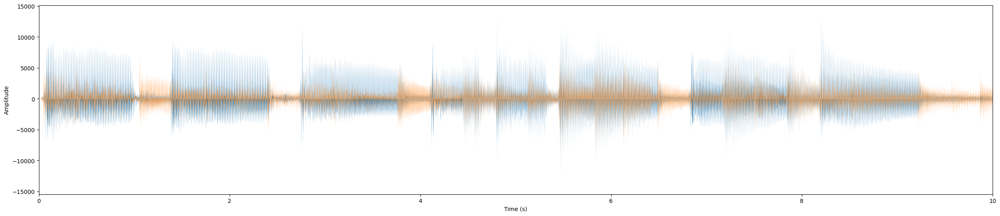

In [4]:
#Q1
fname = 'mix.wav'

rate, x = wavfile.read(fname)
print('T = {:d}, M = {:d}'.format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)

In [5]:
print(x.shape)

(220501, 2)


### Question 1:
This track contains K instruments: a bass, a guitar and a piano with the bass coming from the left and the guitar coming from the rightw while the piano seems to be more towards the center but maybe a bit to the right as well.

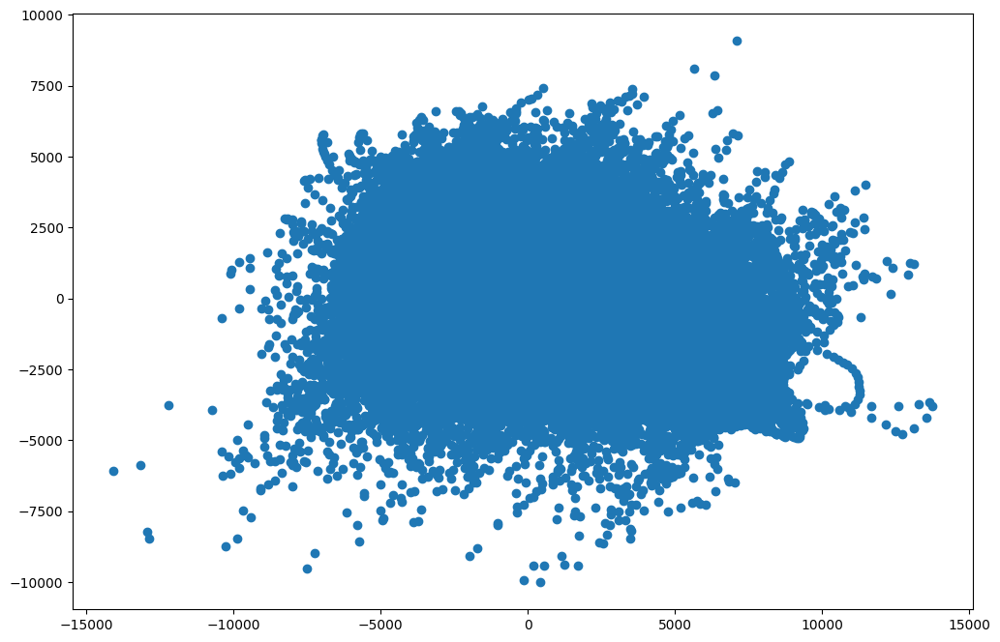

In [6]:
#Q2 Dispersion diagram
x1,x2 = x[:,0],x[:,1]
plt.scatter(x1,x2)
plt.show()

### Question 2:
The dispersion diagram looks like a blob of points with no apparent logic, we can't distinguish the sources by just looking at it.

In [7]:
write('new_mix.wav', rate, np.array(x, dtype=np.int16)) # to write a new wave file

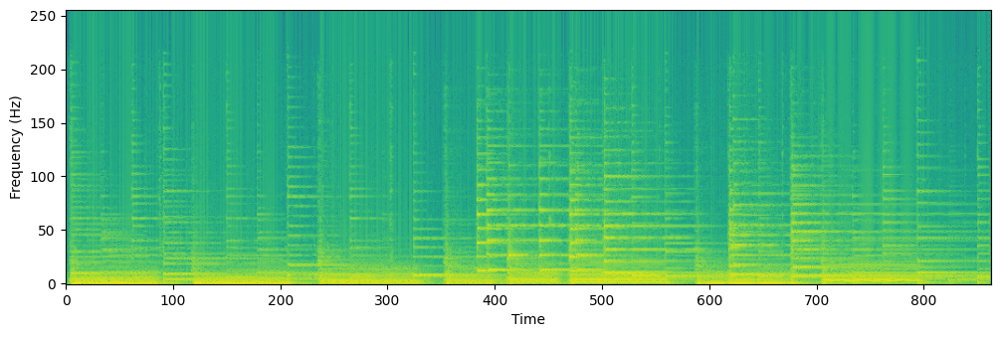

In [8]:
#Q3
X = mdct(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[...,0]

X_norm = np.abs(Z)**2

plt.imshow(np.log(X_norm+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

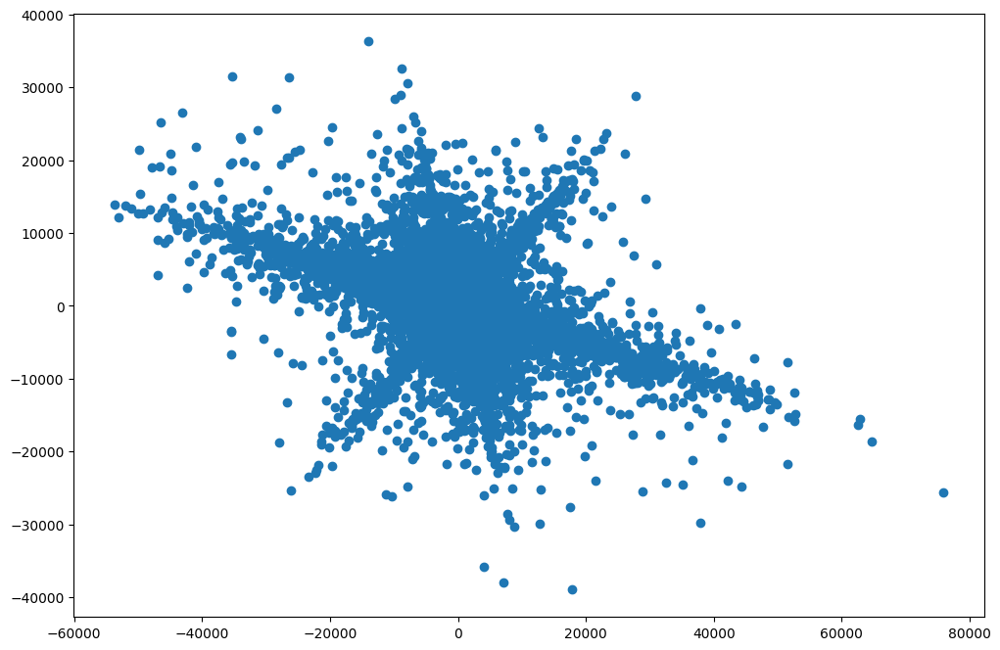

In [9]:
#Q4 Dispersion diagram of MDCT
X1,X2 = X[:,:,0],X[:,:,1]
plt.scatter(X1,X2)
plt.show()

### Question 4:
The dispersion diagram of the MDCT is clearer than the original signal's one. Here we can distinguish 3 important directions corresponding to the K=3 sources of the signal.

C:\Users\maelm\AppData\Local\Temp\ipykernel_15512\1168200900.py:2: RuntimeWarning: invalid value encountered in divide
  args = np.arctan(X2/X1)


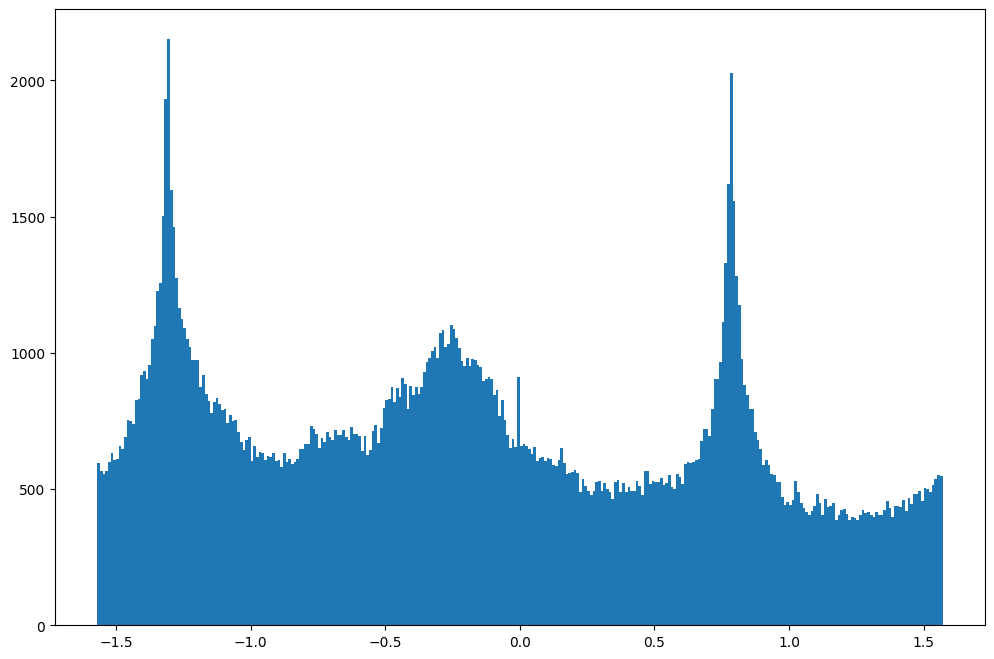

In [10]:
#Q5 Histogram of arguments
args = np.arctan(X2/X1)
args[np.isnan(args)]=0
plt.hist(args.ravel(),314)
plt.show()

In [11]:
print(args.shape)

(256, 863)


### Question 5:
Thanks to the histogram we can get the three directions we saw on the dispersion diagram abore. Those are -1.3 radians, -0.25 radians and 0.8 radians.

In [12]:
#Q6 Create binary mask B
thetak = [-1.3,-0.25,0.8]
sink = np.sin(thetak)
m,n = args.shape
B = []
for i in range(m):
    b = []
    for j in range(n):
        arg = args[i,j]
        deviation = np.abs(sink-arg*np.ones(3))
        m = np.argmin(deviation)
        a = np.zeros(3,dtype=int)
        a[m] = 1
        b.append(a)
    B.append(b)

B = np.array(B)

In [13]:
#Q7 Apply mask then reconstruct images of sources
print(X.shape)
print(B.shape)
m,n,_ = X.shape
Y = []
for i in range(m):
    y = []
    for j in range(n):
        b = B[i,j]
        x = X[i,j]
        y.append([b*x[0],b*x[1]])
    Y.append(y)

Y = np.array(Y)
y1 = imdct(Y[:,:,:,0], window=hamming, framelength=512)
y2 = imdct(Y[:,:,:,1], window=hamming, framelength=512)
y3 = imdct(Y[:,:,:,2], window=hamming, framelength=512)

(256, 863, 2)
(256, 863, 3)


In [14]:
#Q8 listening to the reconstructed sound images
play_sound(y1,rate)
play_sound(y2,rate)
play_sound(y3,rate)

### Question 8:
When each instrument is actually playing, it sounds just like it did in the original audio: the sound is the same and comes from the same direction. However, when the instrument is not playing in reality we can hear a weird deep noise here instead.

In [15]:
#Q9 MMSE estimator
print(Y.shape)
m,n,_,_ = Y.shape
S = []
for i in range(m):
    s = []
    for j in range(n):
        a = []
        for k in range(3):
            a.append(Y[i,j,0,k]*np.cos(thetak[k])+Y[i,j,1,k]*np.sin(thetak[k]))
        s.append(a)
    S.append(s)

S = np.array(S)
s1 = imdct(S[:,:,0], window=hamming, framelength=512)
s2 = imdct(S[:,:,1], window=hamming, framelength=512)
s3 = imdct(S[:,:,2], window=hamming, framelength=512)

play_sound(s1,rate)
play_sound(s2,rate)
play_sound(s3,rate)

(256, 863, 2, 3)


In [16]:
#Q10 Respatializing the sources
thetamod = [-1.3,-0.25,0.8]
np.random.shuffle(thetamod)
print(Y.shape)
m,n,_,_ = Y.shape
S = []
for i in range(m):
    s = []
    for j in range(n):
        a = []
        for k in range(3):
            a.append(Y[i,j,0,k]*np.cos(thetamod[k])+Y[i,j,1,k]*np.sin(thetamod[k]))
        s.append(a)
    S.append(s)

S = np.array(S)
s1 = imdct(S[:,:,0], window=hamming, framelength=512)
s2 = imdct(S[:,:,1], window=hamming, framelength=512)
s3 = imdct(S[:,:,2], window=hamming, framelength=512)

play_sound(s1,rate)
play_sound(s2,rate)
play_sound(s3,rate)

A = [[np.cos(thetak[k]),np.sin(thetak[k])] for k in range(3)]
A = np.array(A)
X = S@A
x = imdct(X, window=hamming, framelength=512)

(256, 863, 2, 3)


In [17]:
play_sound(x,rate)

### Question 10:
The direction switching actually works but we didn't solve the earlier problem of the deep frying noise.